In [1]:
%load_ext autoreload
%autoreload 2
%pylab inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os, json
import seaborn as sns
sns.set_style('ticks')
sns.set_context('paper')
# import colorcet as cc
palette=['#2f4f4f','#228b22','#00ff00','#000080','#1e90ff','#00ffff','#ff8c00','#deb887','#8b4513','#ff0000','#ff69b4','#800080',]
# sns.palplot(palette)

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [2]:
from nnn.util import *

## Loading and sanity checks

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
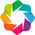

In [17]:
# from colorcet.plotting import swatch, swatches, candy_buttons
import holoviews as hv
hv.extension('bokeh')

In [4]:
candy_buttons("glasbey_bw_minc_20_maxl_70")

:Points   [x,y]   (color)

In [389]:
r2_series = pd.read_pickle('/Users/yuxi/workspace/nnn/data/series_merged/NNNlib2b_DNA_20211221.pkl')

In [578]:
r1 = read_fitted_variant('/Users/yuxi/workspace/nnn/data/fitted_variant/NNNlib2b_DNA_20211022_v6.CPvariant.gz')
r2 = read_fitted_variant('/Users/yuxi/workspace/nnn/data/fitted_variant/NNNlib2b_DNA_20211221_v6.CPvariant.gz')
r3 = read_fitted_variant('/Users/yuxi/workspace/nnn/data/fitted_variant/NNNlib2b_DNA_20211223_v6.CPvariant.gz')
r3_v7 = read_fitted_variant('/Users/yuxi/workspace/nnn/data/fitted_variant/NNNlib2b_DNA_20211223_v7.CPvariant.gz')
annotation = pd.read_csv('/Users/yuxi/workspace/nnn/data/annotation/NNNlib2b_annotation_nupack.txt', sep='\t').set_index('SEQID')

annotation.rename(columns={c: c+'_NUPACK' for c in ['dH', 'dS', 'Tm', 'dG_37C']}, inplace=True)

86.40% variants passed the filter n_clusters > 5 & dG_37_se < 0.2 & Tm_se < 2.5 & dH_se < 2.5 & RMSE < 0.5
77.22% variants passed the filter n_clusters > 5 & dG_37_se < 0.2 & Tm_se < 2.5 & dH_se < 2.5 & RMSE < 0.5
76.77% variants passed the filter n_clusters > 5 & dG_37_se < 0.2 & Tm_se < 2.5 & dH_se < 2.5 & RMSE < 0.5
75.13% variants passed the filter n_clusters > 5 & dG_37_se < 0.2 & Tm_se < 2.5 & dH_se < 2.5 & RMSE < 0.5


In [579]:
mastertable = pd.read_csv('./data/annotation/NNN_mastertable.tsv', sep='\t')
annotation = annotation.reset_index().merge(mastertable[['Series', 'ConstructClass']], on='Series', how='left').set_index('SEQID')

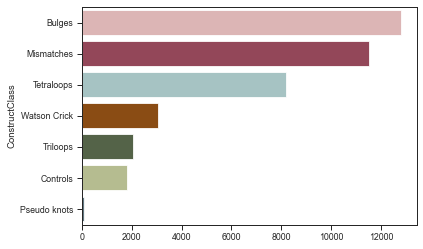

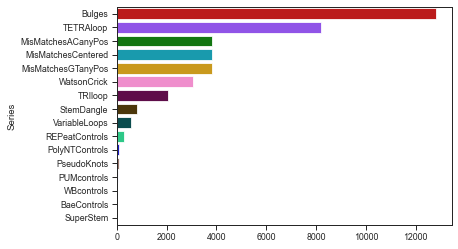

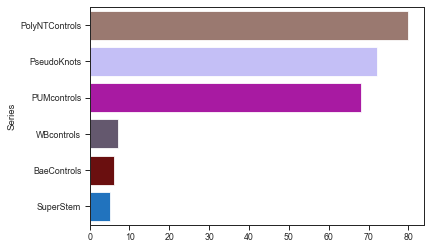

In [599]:
series_count = annotation.groupby('Series').apply(len).sort_values(ascending=False)
class_count = annotation.groupby('ConstructClass').apply(len).sort_values(ascending=False)
sns.barplot(y=class_count.index, x=class_count, orient='h', palette=cc.glasbey_dark[25:])
save_fig('./fig/SuppFig1/num_variant_in_class.pdf')
fig, ax = plt.subplots()
sns.barplot(y=series_count.index, x=series_count, orient='h', palette=cc.glasbey_dark)
save_fig('./fig/SuppFig1/num_variant_in_series.pdf')
fig, ax = plt.subplots()
sns.barplot(y=series_count[-6:].index, x=series_count[-6:], orient='h', palette=cc.glasbey_dark[11:])
save_fig('./fig/SuppFig1/num_variant_in_series_zoomin.pdf')

In [324]:
series_count[-6:]

Series
PolyNTControls    80
PseudoKnots       72
PUMcontrols       68
WBcontrols         7
BaeControls        6
SuperStem          5
dtype: int64

### Comparing v5 and v6

30541 / 32379, 94.32% varaints passed the chi2 test
85.50% variants passed the filter n_clusters > 5 & Tm_se < 2.5 & dH_se < 2.5


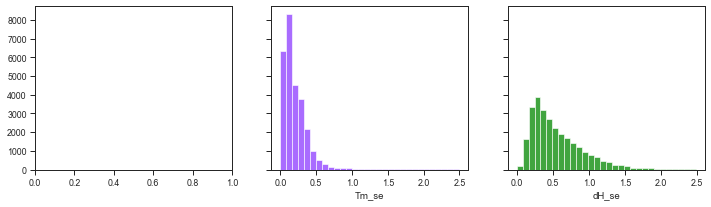

In [5]:
variant_filter = "n_clusters > 5 & Tm_se < 2.5 & dH_se < 2.5"
r1_v5 = read_fitted_variant('/Users/yuxi/workspace/nnn/data/fitted_variant/NNNlib2b_DNA_20211022_v5.CPvariant.gz', filter=False)
r1_v5 = filter_variant_table(r1_v5, variant_filter)
plot_se_dist(r1_v5)

In [156]:
np.percentile(r1.RMSE, 99.9)

0.4223539711213222

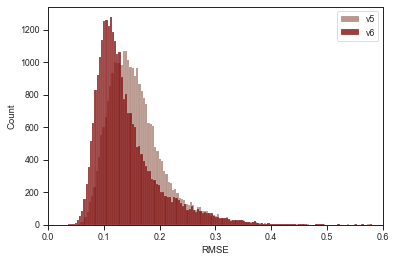

In [157]:
fig, ax = plt.subplots(1,1)
sns.histplot(r1_v5.RMSE, ax=ax, color=cc.glasbey_dark[11])
sns.histplot(r1.RMSE, ax=ax, color=cc.glasbey_dark[15])
plt.legend(['v5', 'v6'])
plt.xlim([0, 0.6])
save_fig('./fig/v5_v6_RMSE.pdf')

(0.0, 2.0)

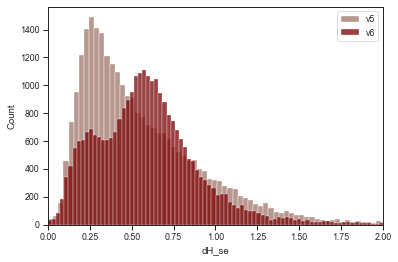

In [151]:
fig, ax = plt.subplots(1,1)
sns.histplot(r1_v5.dH_se, ax=ax, color=cc.glasbey_dark[11])
sns.histplot(r1.dH_se, ax=ax, color=cc.glasbey_dark[15])
plt.legend(['v5', 'v6'])
plt.xlim([0, 2])

(0.0, 1.0)

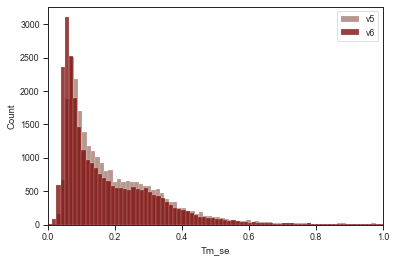

In [153]:
fig, ax = plt.subplots(1,1)
sns.histplot(r1_v5.Tm_se, ax=ax, color=cc.glasbey_dark[11])
sns.histplot(r1.Tm_se, ax=ax, color=cc.glasbey_dark[15])
plt.legend(['v5', 'v6'])
plt.xlim([0, 1])

(0.5, 1.5)

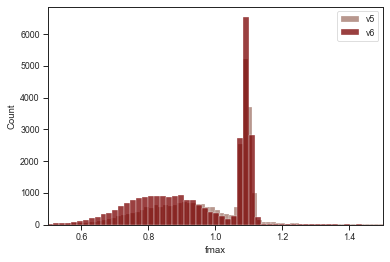

In [159]:
fig, ax = plt.subplots(1,1)
sns.histplot(r1_v5.fmax, ax=ax, color=cc.glasbey_dark[11])
sns.histplot(r1.fmax, ax=ax, color=cc.glasbey_dark[15])
plt.legend(['v5', 'v6'])
plt.xlim([.5, 1.5])

(-0.2, 0.2)

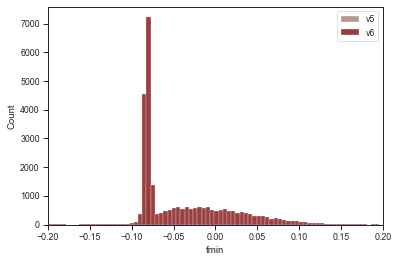

In [162]:
fig, ax = plt.subplots(1,1)
sns.histplot(r1_v5.fmin, ax=ax, color=cc.glasbey_dark[11])
sns.histplot(r1.fmin, ax=ax, color=cc.glasbey_dark[15])
plt.legend(['v5', 'v6'])
plt.xlim([-.2, .2])

### Sanity checks of the replicates

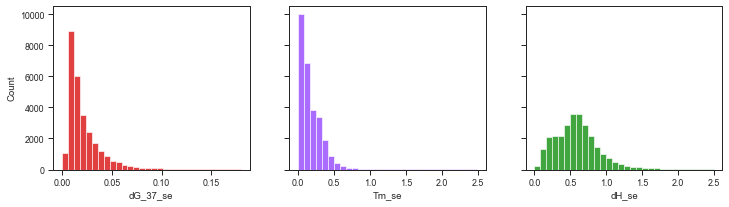

In [126]:
plot_se_dist(r1)
save_fig('./fig/standard_err_20211022.pdf')

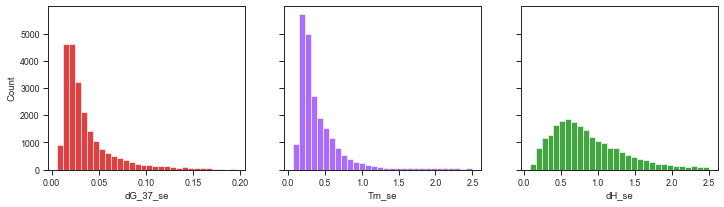

In [6]:
plot_se_dist(r2)
save_fig('./fig/standard_err_20211221.pdf')

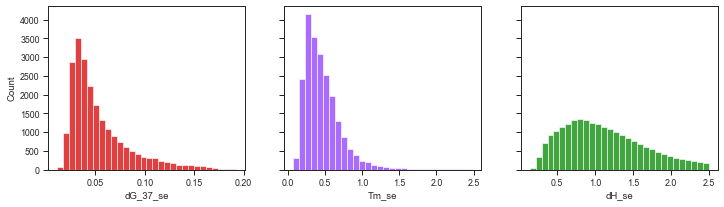

In [8]:
plot_se_dist(r3)
save_fig('./fig/standard_err_20211223.pdf')

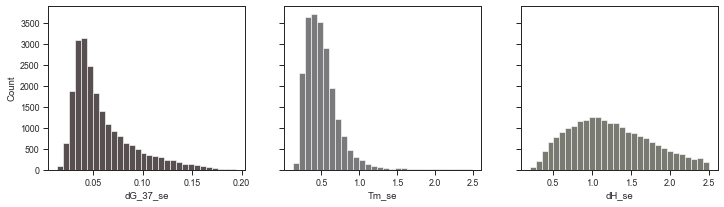

In [555]:
plot_se_dist(r3_v7)
save_fig('./fig/standard_err_20211223_v7.pdf')

### Melt and anneal correlation

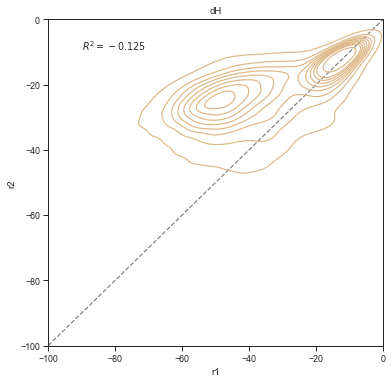

In [26]:
plot_rep_comparison(r1, r2, param='dH', lim=[-100, 0])
# sns.displot(data=df, x='dG_37_x', y='dG_37_y', cmap='cet_fire')

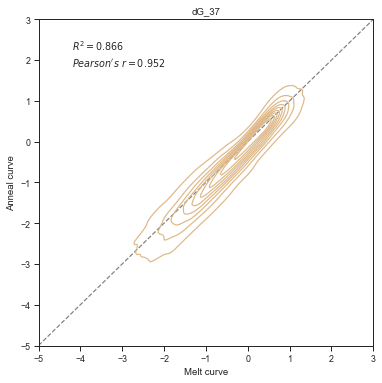

In [310]:
plot_rep_comparison(r2, r3, param='dG_37', lim=[-5, 3])
plt.xlabel('Melt curve')
plt.ylabel('Anneal curve')
save_fig('./fig/melt_anneal/dG_37_all_corr.pdf')

Text(0, 0.5, 'Anneal curve')

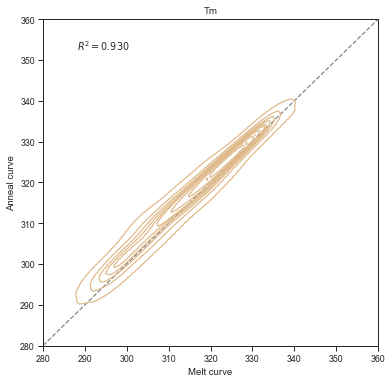

In [35]:
plot_rep_comparison(r2, r3, param='Tm', lim=[280, 360])
plt.xlabel('Melt curve')
plt.ylabel('Anneal curve')

Series Bulges,  6739 variants
Series TETRAloop,  3378 variants
Series MisMatchesGTanyPos,  2763 variants
Series MisMatchesCentered,  2220 variants
Series MisMatchesACanyPos,  2018 variants
Series WatsonCrick,  1773 variants
Series TRIloop,  837 variants
Series PUMcontrols,  14 variants
Series VariableLoops,  8 variants
Series BaeControls,  4 variants
Series REPeatControls,  3 variants
Series PolyNTControls,  2 variants


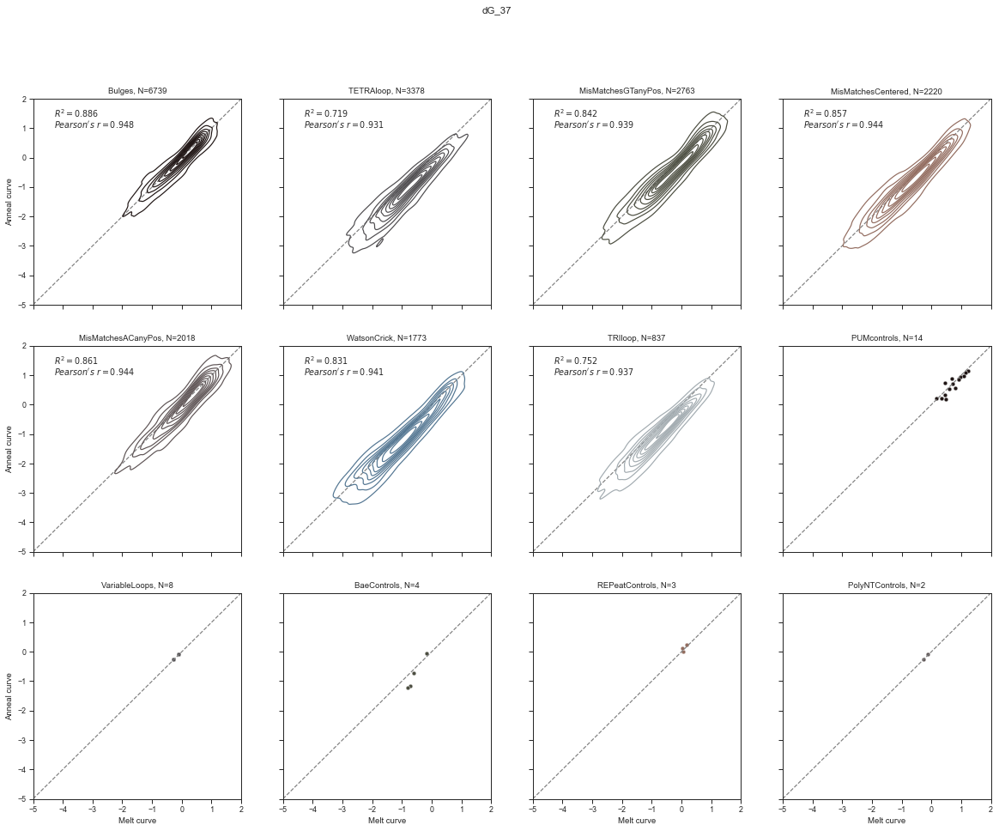

In [94]:
fig, ax = plot_rep_comparison_by_series(r2, r3, annotation, 'dG_37',
                              lim=[-5, 2], xlabel='Melt curve', ylabel='Anneal curve')
save_fig('./fig/melt_anneal/dG_37_by_series.pdf')

ConstructType NNN_3primebulge,  3424 variants
ConstructType NNN_5prime_bulge,  3315 variants


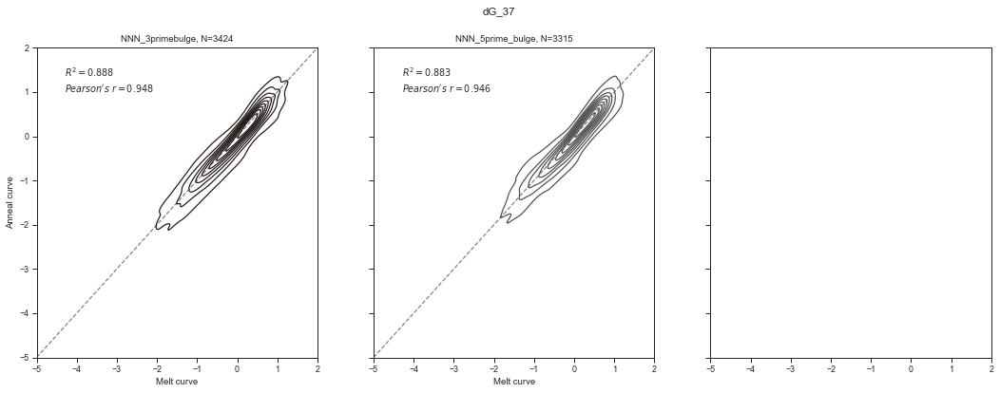

In [342]:
fig, ax = plot_rep_comparison_by_ConstructType(r2, r3, annotation, 'dG_37', 'Bulges',
                                               lim=[-5, 2], xlabel='Melt curve', ylabel='Anneal curve')
save_fig('./fig/melt_anneal/Bulges_lengths.pdf')

ConstructType WC_5ntstem,  661 variants
ConstructType WC_6ntstem,  623 variants
ConstructType WC_7ntstem,  489 variants


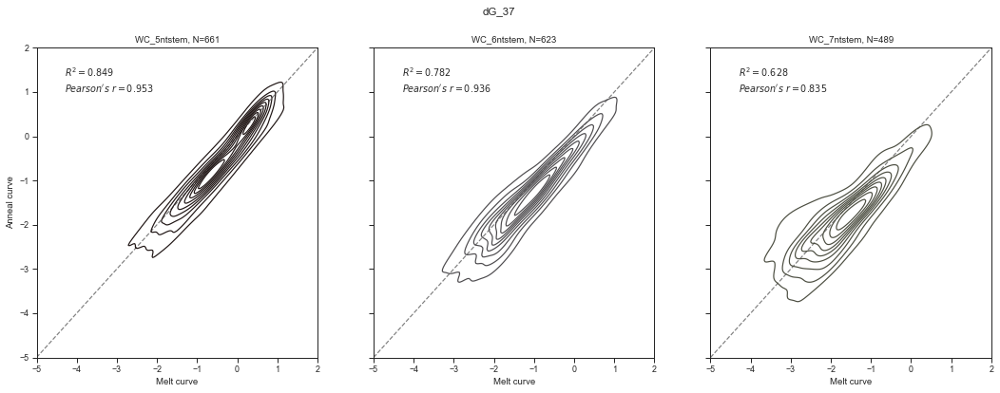

In [341]:
fig, ax = plot_rep_comparison_by_ConstructType(r2, r3, annotation, 'dG_37', 'WatsonCrick',
                                               lim=[-5, 2], xlabel='Melt curve', ylabel='Anneal curve')
save_fig('./fig/melt_anneal/WC_lengths.pdf')

Series Bulges,  6739 variants
Series TETRAloop,  3378 variants
Series MisMatchesGTanyPos,  2763 variants
Series MisMatchesCentered,  2220 variants
Series MisMatchesACanyPos,  2018 variants
Series WatsonCrick,  1773 variants
Series TRIloop,  837 variants
Series PUMcontrols,  14 variants
Series VariableLoops,  8 variants
Series BaeControls,  4 variants
Series REPeatControls,  3 variants
Series PolyNTControls,  2 variants


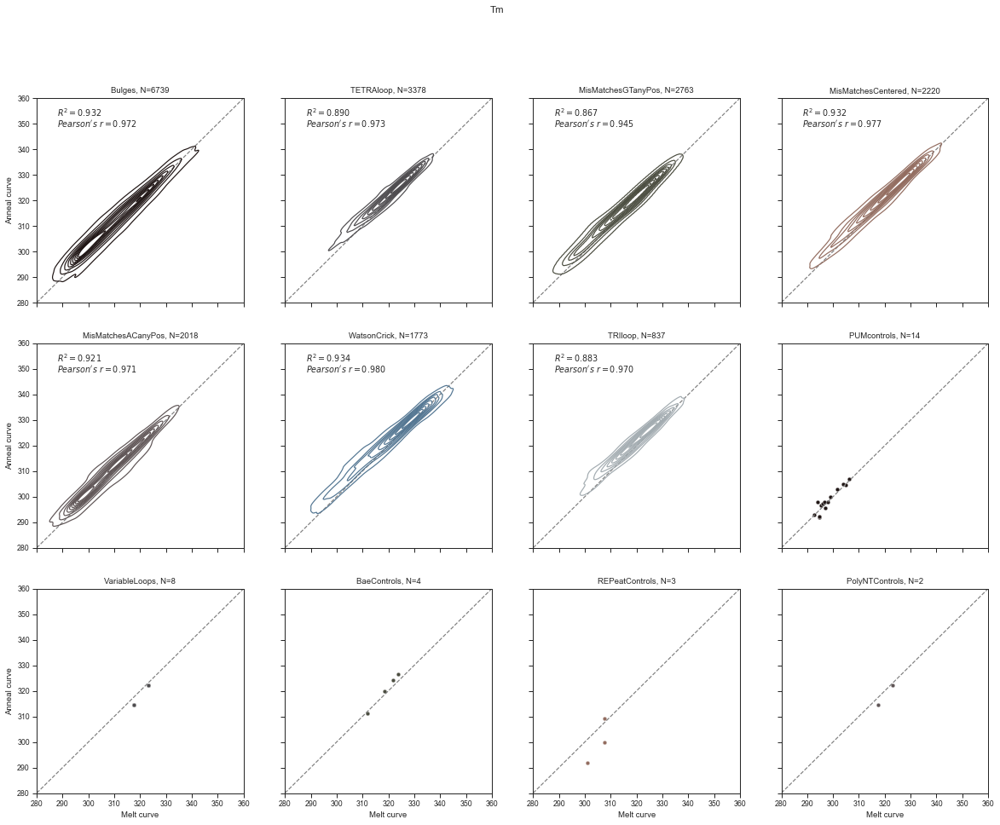

In [95]:
fig, ax = plot_rep_comparison_by_series(r2, r3, annotation, 'Tm',
                              lim=[280, 360], xlabel='Melt curve', ylabel='Anneal curve')
save_fig('./fig/melt_anneal/Tm_by_series.pdf')

Series Bulges,  6739 variants
Series TETRAloop,  3378 variants
Series MisMatchesGTanyPos,  2763 variants
Series MisMatchesCentered,  2220 variants
Series MisMatchesACanyPos,  2018 variants
Series WatsonCrick,  1773 variants
Series TRIloop,  837 variants
Series PUMcontrols,  14 variants
Series VariableLoops,  8 variants
Series BaeControls,  4 variants
Series REPeatControls,  3 variants
Series PolyNTControls,  2 variants


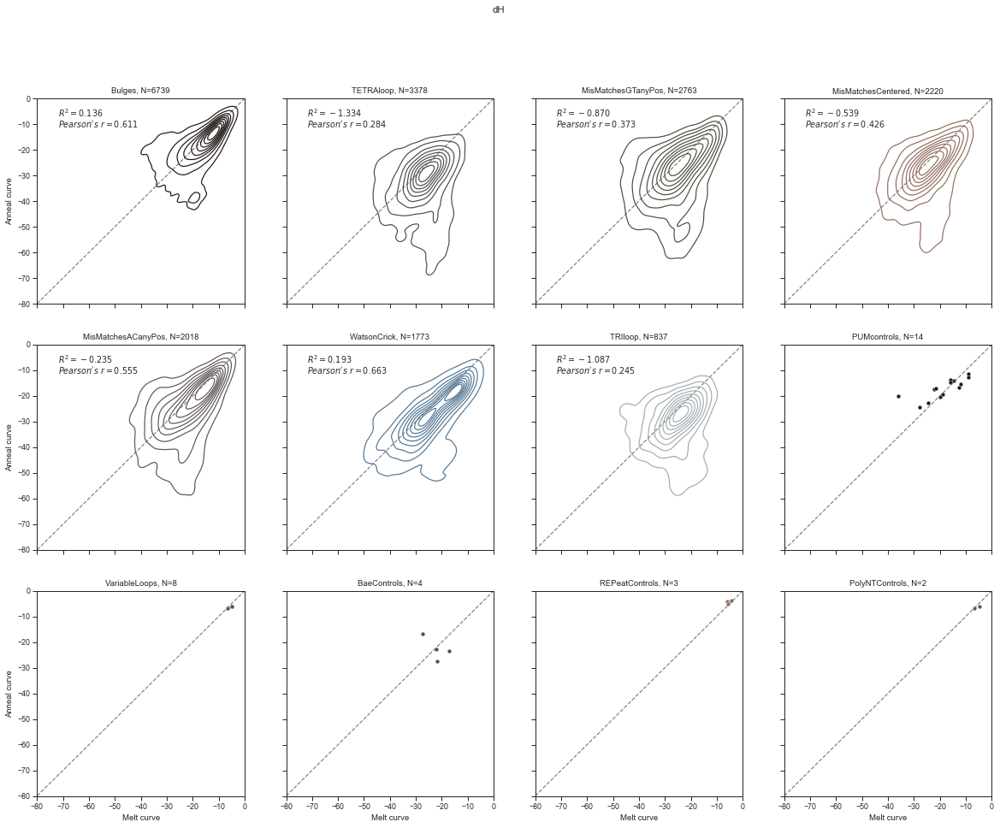

In [96]:
fig, ax = plot_rep_comparison_by_series(r2, r3, annotation, 'dH',
                              lim=[-80, 0], xlabel='Melt curve', ylabel='Anneal curve')
save_fig('./fig/melt_anneal/dH_by_series.pdf')

## Combining multiple experiments

In [97]:
df = combine_experiments(r1, r2)

## Account for inter-experimental error

In [98]:
df['ddH_zscore'], df['ddH_se'], dH_offset = get_combined_ddX(df.dH_x, df.dH_y, df.dH_se_x, df.dH_se_y)
df['ddG_37_zscore'], df['ddG_37_se'], dG_37_offset = get_combined_ddX(df.dG_37_x, df.dG_37_y, df.dG_37_se_x, df.dG_37_se_y)

In [100]:
dH_offset, dG_37_offset

(-12.24813303957064, -0.04738030891805432)

(-50.0, 50.0)

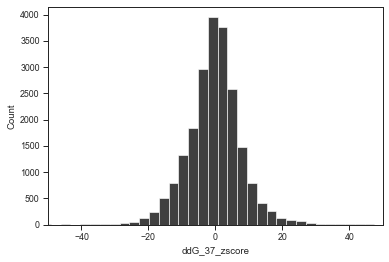

In [101]:
sns.histplot(df['ddG_37_zscore'], bins=50, color='k')
plt.xlim([-50, 50])

In [103]:
df['ddG_bin'] = pd.qcut(df.ddG_37_se, 100)

In [108]:
sigma_df = df[['ddG_37_zscore', 'ddG_bin']].groupby('ddG_bin').apply(std).rename(columns={'ddG_37_zscore':'ddG_37_zscore_std'})

/Users/yuxi/opt/anaconda3/envs/py38/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3579: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)


In [109]:
sigma_df['intra_err'] = [x.mid for x in sigma_df.index.values]

(-75.0, 75.0)

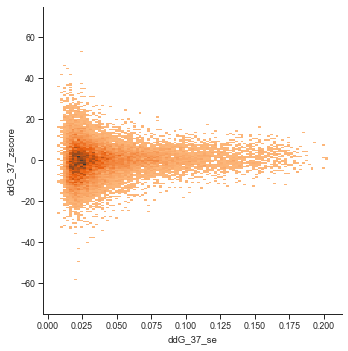

In [135]:
sns.displot(data=df, x='ddG_37_se', y='ddG_37_zscore', cmap='Oranges_d')
plt.ylim([-75, 75])

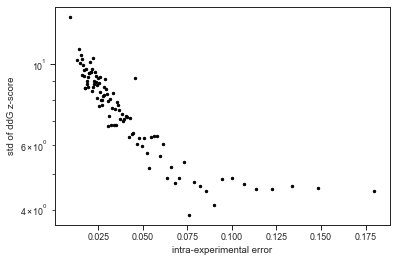

In [137]:
plt.plot(sigma_df.intra_err, sigma_df.ddG_37_zscore_std, 'k.')
plt.xlabel('intra-experimental error')
plt.ylabel('std of ddG z-score')
# plt.xscale('log')
plt.yscale('log')

In [138]:
from lmfit.models import PowerLawModel

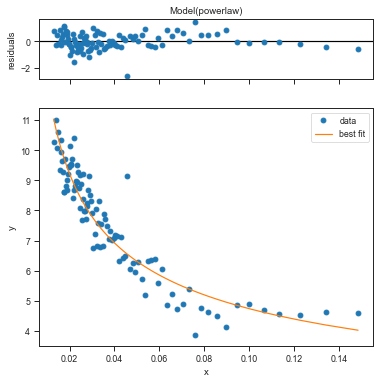

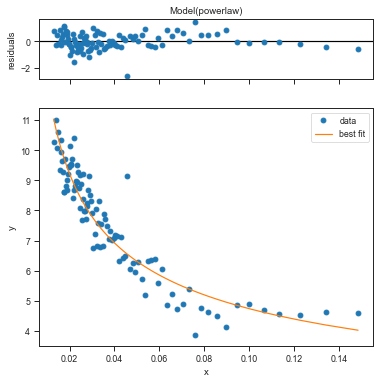

In [161]:
model = PowerLawModel()
powerlaw_result = model.fit(sigma_df.ddG_37_zscore_std[1:-1], x=sigma_df.intra_err[1:-1])

powerlaw_result.plot()

In [162]:
powerlaw_result.best_values

{'amplitude': 1.8323177615465982, 'exponent': -0.4130250376576531}

In [166]:
powerlaw_result.eval(x=0.14)

4.127349933297676

In [170]:
df['dG_37_se_corrected'] = df.dG_37_se * powerlaw_result.eval(x=df.ddG_37_se)

(0.0, 0.01)

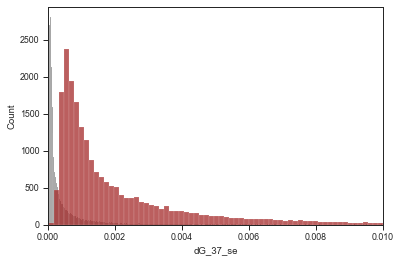

In [177]:
sns.histplot(df.dG_37_se, color='gray')
sns.histplot(df.dG_37_se_corrected, color='brown')
plt.xlim([0,0.01])

(0.0, 0.02)

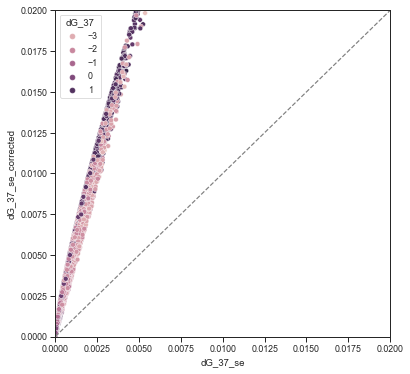

In [191]:
fig, ax = plt.subplots(figsize=(6,6))
plt.plot([0,0.02],[0,0.02],'--', c='gray')
sns.scatterplot(x=df.dG_37_se, y=df.dG_37_se_corrected, hue=df.dG_37)
plt.xlim([0,0.02])
plt.ylim([0,0.02])

(-50.0, 50.0)

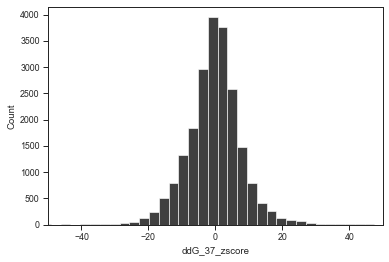

In [101]:
sns.histplot(df['ddG_37_zscore'], bins=50, color='k')
plt.xlim([-50, 50])

In [ ]:
sns.histplot(df.dG_37_se_corrected)

/Users/yuxi/opt/anaconda3/envs/py38/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3579: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)


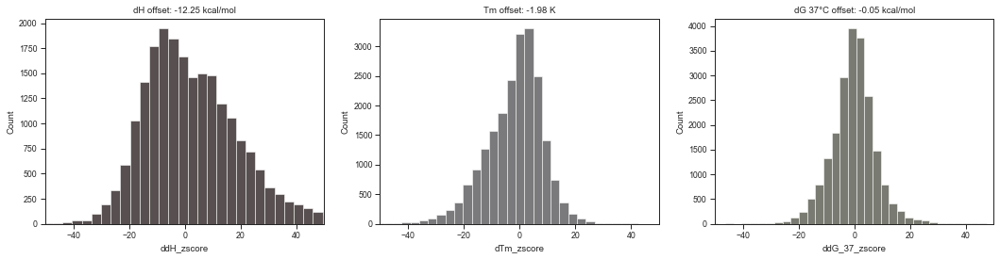

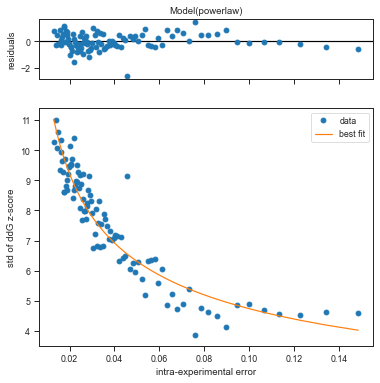

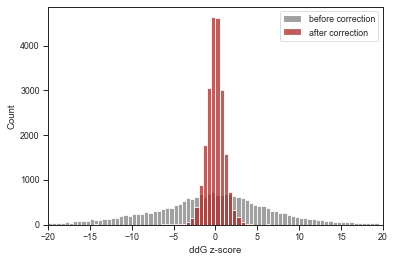

In [248]:

df = combine_and_correct_interexperiment_error(r1, r2, figdir='./fig/correct_rep_error_211022vs211221')

/Users/yuxi/opt/anaconda3/envs/py38/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3579: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)


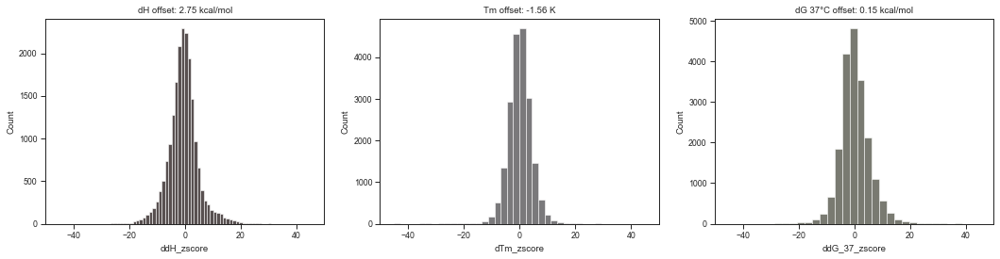

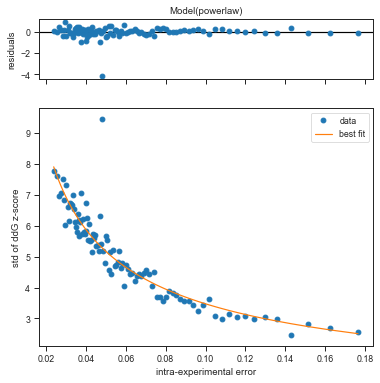

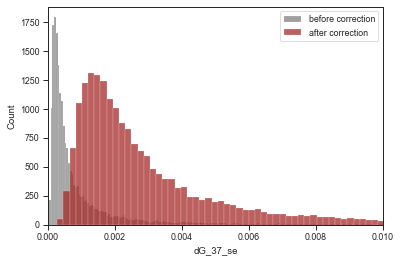

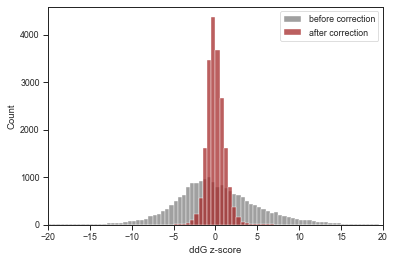

In [273]:

df = combine_and_correct_interexperiment_error(r2, r3, figdir='./fig/correct_rep_error_211221vs211223')

In [252]:
from scipy.stats import norm
zscore_ub = norm.ppf(q=0.005), norm.ppf(q=0.995)

In [258]:
np.sum(np.abs(df.ddG_37_zscore) > zscore_ub) / len(df)

0.5637689230925016

In [257]:
np.sum(np.abs(df.ddG_37_zscore_corrected) > zscore_ub) / len(df)

0.018226925218976255

In [275]:
df[np.abs(df.ddG_37_zscore_corrected) > zscore_ub].sort_values(by='ddG_37_zscore_corrected')

,Tm_x,Tm_lb_x,Tm_std_x,Tm_ub_x,dG_37_x,dG_37_lb_x,dG_37_std_x,dG_37_ub_x,dH_x,dH_lb_x,...,ddH_zscore,ddH_se,dTm_zscore,dTm_se,ddG_37_zscore,ddG_37_se,ddG_bin,dG_37_se_corrected,ddG_37_se_corrected,ddG_37_zscore_corrected
SEQID,,,,,,,,,,,,,,,,,,,,,
BNNN6914,325.291555,322.483007,1.471835,328.042130,-1.331493,-1.657078,0.183852,-0.971380,-28.259434,-35.717591,...,-21.781831,0.804022,14.857816,0.519412,-27.688394,0.040490,"(0.0405, 0.041]",0.002331,0.236191,-4.746636
BNNN6751,330.222758,327.318512,1.970718,334.459325,-1.779454,-2.672518,0.402849,-1.252214,-28.991226,-44.882162,...,-15.339375,1.433786,3.857244,1.322236,-16.316349,0.087852,"(0.0864, 0.0884]",0.006675,0.328656,-4.361465
TRINNN667,320.305947,318.865345,1.244458,323.765852,-1.804536,-2.434183,0.304671,-1.371241,-56.954974,-83.073261,...,-21.191850,2.200294,-4.704508,0.772415,-18.118154,0.073148,"(0.0721, 0.0737]",0.005551,0.303957,-4.360151
BNNN5225,326.708730,321.460061,2.467084,332.161492,-0.969214,-1.371081,0.187647,-0.620957,-18.641212,-26.651535,...,-20.469680,0.520246,18.173362,0.566268,-28.773381,0.030050,"(0.0299, 0.0305]",0.001377,0.207983,-4.157266
MMGTP1971,330.168504,328.145057,1.122699,332.104869,-2.616739,-3.941907,0.503923,-1.989033,-42.968330,-67.851828,...,-14.188067,1.976466,-1.371128,0.527005,-13.080530,0.115884,"(0.114, 0.118]",0.010376,0.369861,-4.098355
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TETNNN2619,319.869733,316.510174,1.618738,322.825140,-1.368625,-1.788985,0.196643,-1.000447,-45.253381,-64.531845,...,11.573420,2.946159,-6.044147,0.343132,18.172946,0.101110,"(0.1, 0.103]",0.004002,0.348961,5.265532
TRINNN891,304.194070,299.374234,3.128602,310.502245,0.279882,-0.012806,0.186762,0.645809,-14.102362,-19.876897,...,13.363734,1.697943,-28.082250,0.532039,31.363613,0.046838,"(0.0467, 0.0473]",0.002690,0.251326,5.844994
MMCNNN1346,295.431210,290.806416,2.938383,301.419635,0.562287,0.259715,0.227290,1.069361,-11.774347,-17.581866,...,16.576938,1.276224,-53.263538,0.416574,36.123549,0.039603,"(0.0396, 0.04]",0.002304,0.233970,6.114495


In [281]:
conds2 = [x for x in r2.columns if x.endswith('_norm')][:-1]
conds3 = [x for x in r3.columns[::-1] if x.endswith('_norm')][:-1]

In [282]:
conds2

['Green12_20.0_norm',
 'Green13_22.5_norm',
 'Green14_25.0_norm',
 'Green15_27.5_norm',
 'Green16_30.0_norm',
 'Green17_32.5_norm',
 'Green18_35.0_norm',
 'Green19_37.5_norm',
 'Green20_40.0_norm',
 'Green21_42.5_norm',
 'Green22_45.0_norm',
 'Green23_47.5_norm',
 'Green24_50.0_norm',
 'Green25_52.5_norm',
 'Green26_55.0_norm',
 'Green27_57.5_norm',
 'Green28_60.0_norm']

In [304]:
differ_variants = df.sort_values(by='ddG_37_zscore_corrected')[:10].index.tolist() + df.sort_values(by='ddG_37_zscore_corrected')[-10:].index.tolist()
df['ddG_37_zscore_corrected_abs'] = np.abs(df.ddG_37_zscore_corrected)
similar_variants = df.sort_values(by='ddG_37_zscore_corrected_abs')[:20].index.tolist()
# similar_variants

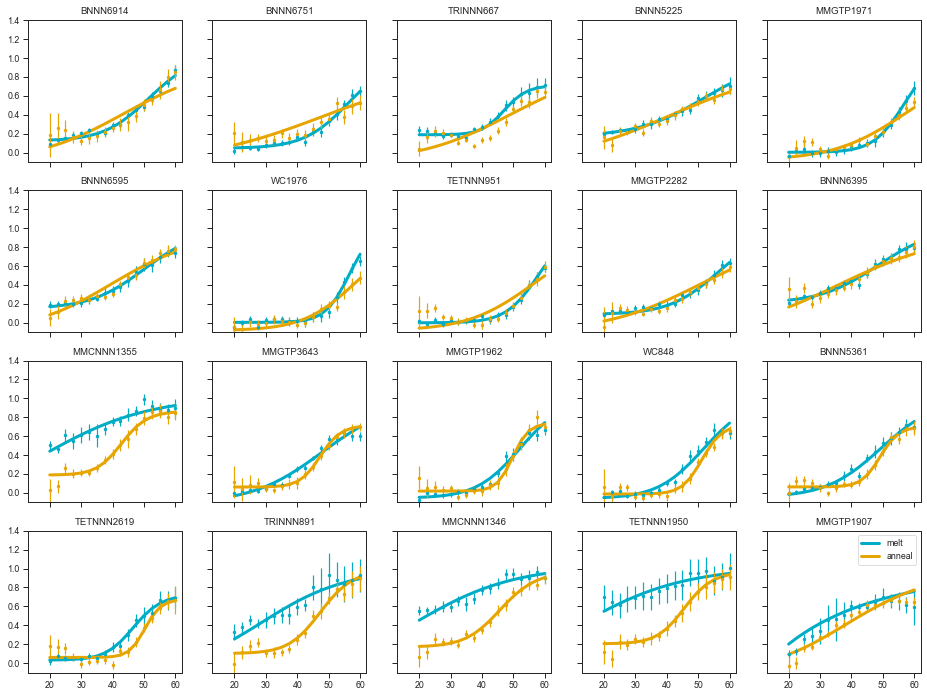

In [328]:
fig, ax = plt.subplots(4,5, sharex=True, sharey=True, figsize=(16,12))
ax = ax.flatten()
for i,variant in enumerate(differ_variants):
    plot_actual_and_expected_fit(r2.loc[variant,:], ax=ax[i], conds=conds2, c=palette[3])
    plot_actual_and_expected_fit(r3.loc[variant,:], ax=ax[i], conds=conds3, c=palette[4])
    ax[i].set_title(variant)
    
plt.legend(['melt', 'anneal'])
save_fig('./fig/melt_anneal/agree_worst_variants.pdf')

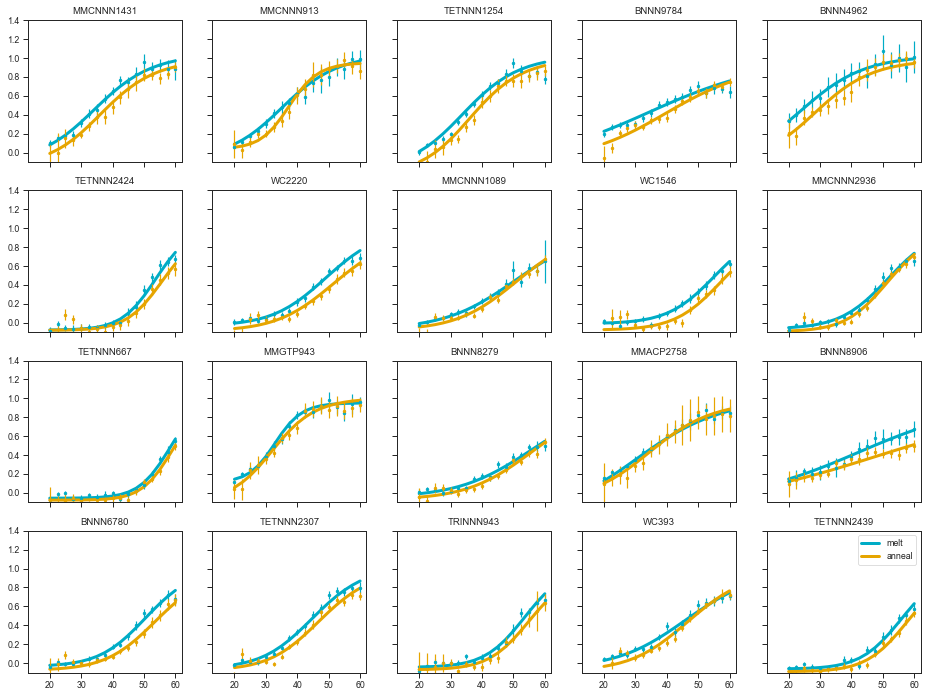

In [333]:
fig, ax = plt.subplots(4,5, sharex=True, sharey=True, figsize=(16,12))
ax = ax.flatten()
for i,variant in enumerate(similar_variants):
    plot_actual_and_expected_fit(r2.loc[variant,:], ax=ax[i], conds=conds2, c=palette[3])
    plot_actual_and_expected_fit(r3.loc[variant,:], ax=ax[i], conds=conds3, c=palette[4])
    ax[i].set_title(variant)
    
plt.legend(['melt', 'anneal'])
save_fig('./fig/melt_anneal/agree_best_variants.pdf')

## Fluorescence as a function of length

In [395]:
repeat_series = r2_series.query('Series == "REPeatControls"')
repeat_series['length'] = repeat_series.RefSeq.apply(len)

/var/folders/_q/8__k6pc13sd827z6scxzrbnc0000gn/T/ipykernel_84237/2984603132.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repeat_series['length'] = repeat_series.RefSeq.apply(len)


In [410]:
dangle_5p = annotation.query('ConstructType=="strong_stem_var_5prime_dangleAlen"')
dangle_5p

,Series,ConstructType,Scaffold,Scaffoldposition,RefSeq,dH_NUPACK,dS_NUPACK,Tm_NUPACK,dG_37C_NUPACK
SEQID,,,,,,,,,
SD1,StemDangle,strong_stem_var_5prime_dangleAlen,GCGCGCGC,Top,AGCGCGAAAGCGC,-39.807114,-0.109406,90.697327,-5.862198
SD4,StemDangle,strong_stem_var_5prime_dangleAlen,GCGCGCGC,Top,AAGCGCGAAAGCGC,-39.807114,-0.109406,90.697327,-5.862198
SD7,StemDangle,strong_stem_var_5prime_dangleAlen,GCGCGCGC,Top,AAAGCGCGAAAGCGC,-39.807114,-0.109406,90.697327,-5.862198
SD10,StemDangle,strong_stem_var_5prime_dangleAlen,GCGCGCGC,Top,AAAAGCGCGAAAGCGC,-39.807114,-0.109406,90.697327,-5.862198
SD13,StemDangle,strong_stem_var_5prime_dangleAlen,GCGCGCGC,Top,AAAAAGCGCGAAAGCGC,-39.807114,-0.109406,90.697327,-5.862198
...,...,...,...,...,...,...,...,...,...
SD147,StemDangle,strong_stem_var_5prime_dangleAlen,GCCGCCGGGCCCGGGCCCGGCGGC,Top,AAAGCCGCCGGGCCCGAAAGGGCCCGGCGGC,-108.177405,-0.280020,113.170206,-21.314823
SD150,StemDangle,strong_stem_var_5prime_dangleAlen,GCCGCCGGGCCCGGGCCCGGCGGC,Top,AAAAGCCGCCGGGCCCGAAAGGGCCCGGCGGC,-108.177405,-0.280020,113.170206,-21.314823
SD153,StemDangle,strong_stem_var_5prime_dangleAlen,GCCGCCGGGCCCGGGCCCGGCGGC,Top,AAAAAGCCGCCGGGCCCGAAAGGGCCCGGCGGC,-108.177405,-0.280020,113.170206,-21.314823


<AxesSubplot:xlabel='length', ylabel='Green14_25.0'>

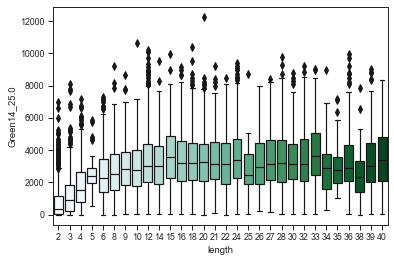

In [398]:
sns.boxplot(data=repeat_series, x='length', y='Green14_25.0', palette='BuGn')

<AxesSubplot:xlabel='length', ylabel='Green09_Quench'>

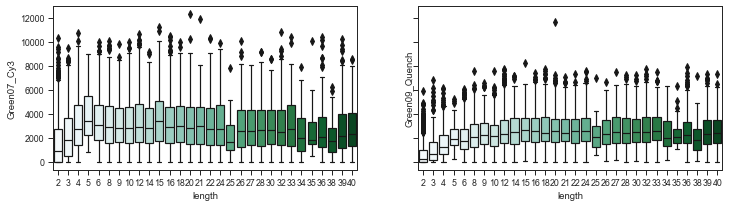

In [408]:
fig, ax = plt.subplots(1, 2, figsize=(12,3), sharey=True)
sns.boxplot(data=repeat_series, x='length', y='Green07_Cy3', palette='BuGn', ax=ax[0])
sns.boxplot(data=repeat_series, x='length', y='Green09_Quench', palette='BuGn', ax=ax[1])

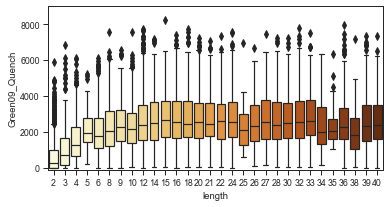

In [585]:
fig, ax = plt.subplots(figsize=(6,3))
sns.boxplot(data=repeat_series, x='length', y='Green09_Quench', palette='YlOrBr', ax=ax)
plt.ylim([-100, 9000])
save_fig('./fig/signal_length/fluorescence_quench_37_repeat_length.pdf')

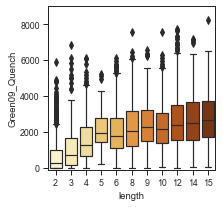

In [586]:
fig, ax = plt.subplots(figsize=(3,3))
sns.boxplot(data=repeat_series.query('length <= 15'), x='length', y='Green09_Quench', palette='YlOrBr', ax=ax)
plt.ylim([-100, 9000])
save_fig('./fig/signal_length/fluorescence_quench_37_repeat_length_short.pdf')

fig, ax = plt.subplots(1, 1, figsize=(6,3), sharey=True)
sns.boxplot(x=repeat_series['length'], y=repeat_series['Green09_Quench'] / repeat_series['Green07_Cy3'], palette='BuGn', ax=ax)
plt.ylim([-.1, 3])

3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18


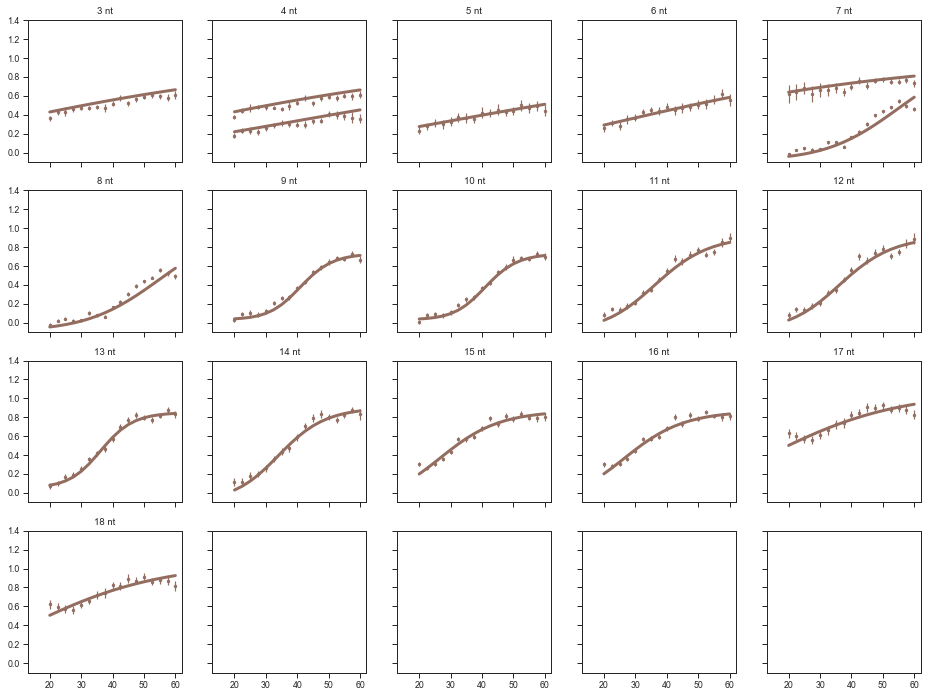

In [388]:
repeat_len = annotation.query('Series=="PolyNTControls"').RefSeq.apply(len)
repeat_len = pd.DataFrame(data=repeat_len).join(r1, how='inner').rename(columns={'RefSeq':'length'})

fig, ax = plt.subplots(4,5, sharex=True, sharey=True, figsize=(16,12))
ax = ax.flatten()
for i,l in enumerate(np.unique(repeat_len.length)):
    print(l)
    for variant in repeat_len[repeat_len.length==l].index:
        plot_actual_and_expected_fit(r1.loc[variant,:], ax=ax[i],  c=palette[3])
    # plot_actual_and_expected_fit(r3.loc[variant,:], ax=ax[i], conds=conds3, c=palette[4])
    ax[i].set_title('%d nt'%l)
    
# plt.legend(['melt', 'anneal'])

## Uncertainty in dG

/Users/yuxi/opt/anaconda3/envs/py38/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3579: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)


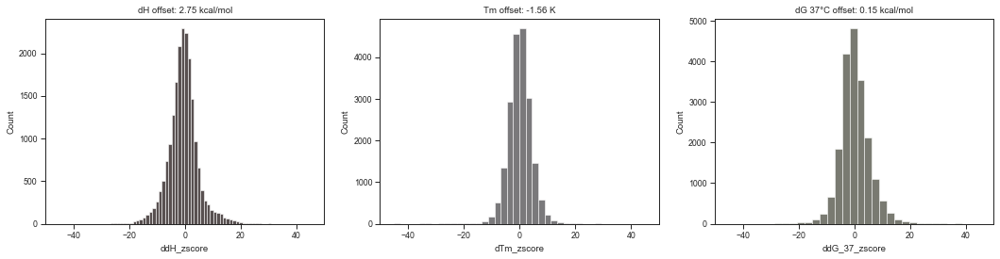

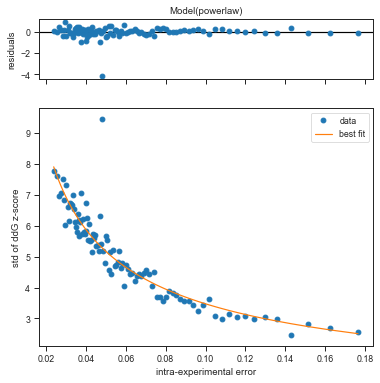

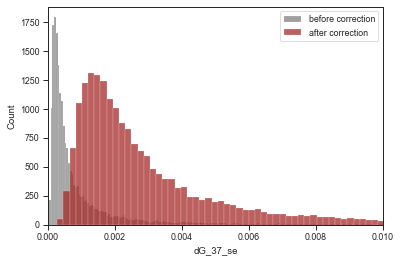

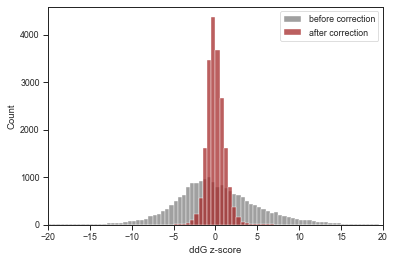

In [534]:
df = combine_and_correct_interexperiment_error(r2, r3, figdir='./fig/correct_rep_error_211221vs211223')
df = df.join(annotation, how='inner')

In [545]:
df['dG_37_bin'] = pd.qcut(df.dG_37, 5)
df['Tm_bin'] = pd.qcut(df.Tm, 5)

In [521]:
major_series = annotation.groupby('Series').apply(len)
major_series = pd.DataFrame(major_series, columns=['Series_size'])
df = df.merge(major_series, on='Series')

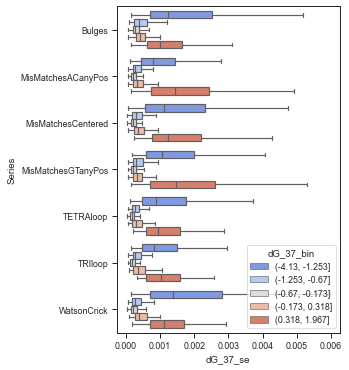

In [522]:
fig, ax = plt.subplots(figsize=(4,6))
sns.boxplot(data=df.query("Series_size > 1000"), orient='h', x='dG_37_se', y='Series', hue='dG_37_bin', showfliers = False, palette='coolwarm')
save_fig('./fig/uncertainty_breakdown/dG_se_by_series.pdf')

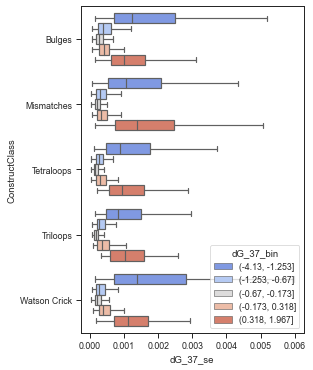

In [530]:
fig, ax = plt.subplots(figsize=(4,6))
sns.boxplot(data=df.query('ConstructClass != "Controls"'), orient='h', x='dG_37_se', y='ConstructClass', hue='dG_37_bin', showfliers = False, palette='coolwarm')
save_fig('./fig/uncertainty_breakdown/dG_se_by_class_dG_bin.pdf')

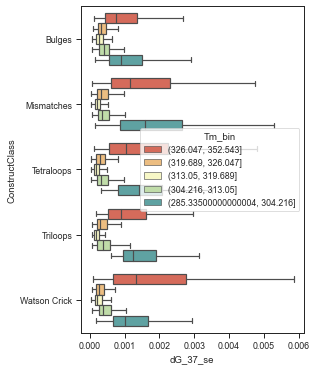

In [550]:
fig, ax = plt.subplots(figsize=(4,6))
sns.boxplot(data=df.query('ConstructClass != "Controls"'), orient='h', x='dG_37_se', y='ConstructClass', hue='Tm_bin', hue_order=hue_order, showfliers = False, palette='Spectral')
save_fig('./fig/uncertainty_breakdown/dG_se_by_class_Tm_bin.pdf')

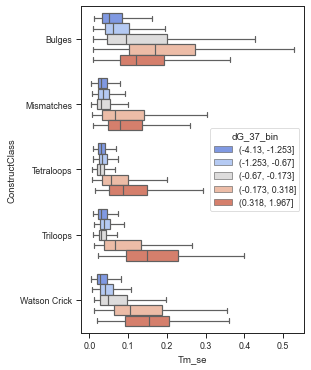

In [531]:
fig, ax = plt.subplots(figsize=(4,6))
sns.boxplot(data=df.query('ConstructClass != "Controls"'), orient='h', x='Tm_se', y='ConstructClass', hue='dG_37_bin', showfliers = False, palette='coolwarm')
save_fig('./fig/uncertainty_breakdown/Tm_se_by_class_dG_bin.pdf')

In [548]:

hue_order[::-1]

array([Interval(326.047, 352.543, closed='right'),
       Interval(319.689, 326.047, closed='right'),
       Interval(313.05, 319.689, closed='right'),
       Interval(304.216, 313.05, closed='right'),
       Interval(285.33500000000004, 304.216, closed='right')],
      dtype=object)

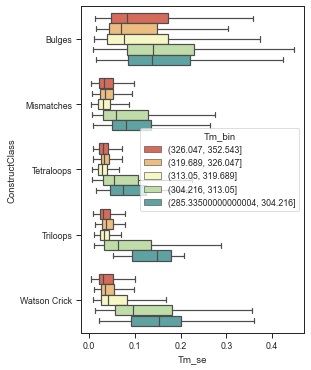

In [549]:
hue_order = np.unique(df.Tm_bin)[::-1]

fig, ax = plt.subplots(figsize=(4,6))
sns.boxplot(data=df.query('ConstructClass != "Controls"'), orient='h', x='Tm_se', y='ConstructClass', hue='Tm_bin', hue_order=hue_order, showfliers = False, palette='Spectral')
save_fig('./fig/uncertainty_breakdown/Tm_se_by_class_Tm_bin.pdf')

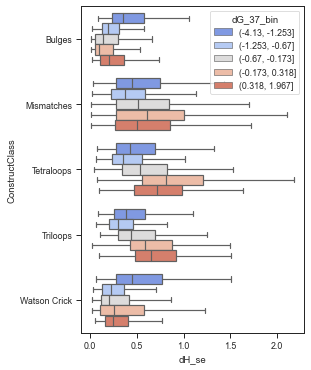

In [553]:
fig, ax = plt.subplots(figsize=(4,6))
sns.boxplot(data=df.query('ConstructClass != "Controls"'), orient='h', x='dH_se', y='ConstructClass', hue='dG_37_bin', showfliers = False, palette='coolwarm')
save_fig('./fig/uncertainty_breakdown/dH_se_by_class_dG_bin.pdf')

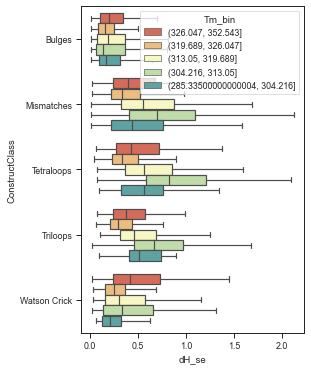

In [552]:
fig, ax = plt.subplots(figsize=(4,6))
sns.boxplot(data=df.query('ConstructClass != "Controls"'), orient='h', x='dH_se', y='ConstructClass', hue='Tm_bin', hue_order=hue_order, showfliers = False, palette='Spectral')
save_fig('./fig/uncertainty_breakdown/dH_se_by_class_Tm_bin.pdf')

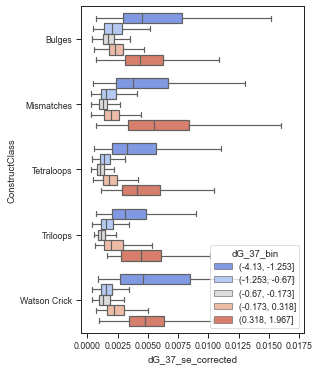

In [518]:
fig, ax = plt.subplots(figsize=(4,6))
sns.boxplot(data=df.query('ConstructClass != "Controls"'), orient='h', x='dG_37_se_corrected', y='ConstructClass', hue='dG_37_bin', showfliers = False, palette='coolwarm')
save_fig('./fig/uncertainty_breakdown/dG_se_by_class_corrected.pdf')

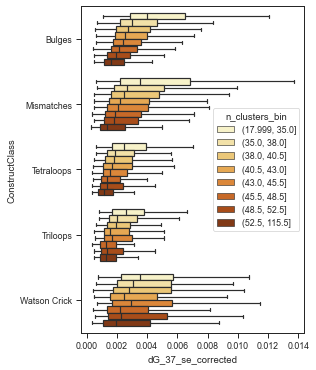

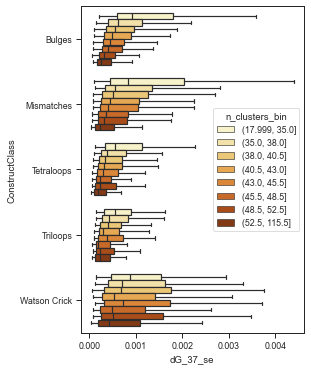

In [600]:
df['n_clusters_bin'] = pd.qcut(np.mean(df[['n_clusters_x', 'n_clusters_y']], axis=1), 8)

fig, ax = plt.subplots(figsize=(4,6))
sns.boxplot(data=df.query('ConstructClass != "Controls"'), orient='h', x='dG_37_se_corrected', y='ConstructClass', hue='n_clusters_bin', showfliers = False, palette='YlOrBr')
save_fig('./fig/uncertainty_breakdown/dG_se_corrected_by_n_clusters.pdf')

fig, ax = plt.subplots(figsize=(4,6))
sns.boxplot(data=df.query('ConstructClass != "Controls"'), orient='h', x='dG_37_se', y='ConstructClass', hue='n_clusters_bin', showfliers = False, palette='YlOrBr')
save_fig('./fig/uncertainty_breakdown/dG_se_by_n_clusters.pdf')

,Series,ConstructType,Scaffold,Scaffoldposition,RefSeq,dH_NUPACK,dS_NUPACK,Tm_NUPACK,dG_37C_NUPACK,Class
0,Bulges,NN_5primebulge,CGCGCGCG,Both,CGAAACGGAAACGTTCG,-41.111930,-0.117135,77.829871,-4.258413,Bulges
1,Bulges,NN_3primebulge,CGCGCGCG,Both,CGAACGGAAACGTATCG,-41.417938,-0.120220,71.366629,-3.651625,Bulges
2,Bulges,NN_5primebulge,CGCGCGCG,Both,CGAAAACGGAAACGTTCG,-32.241636,-0.089632,86.559915,-4.195073,Bulges
3,Bulges,NN_3primebulge,CGCGCGCG,Both,CGAACGGAAACGTAATCG,-33.507018,-0.095713,76.926695,-3.539172,Bulges
4,Bulges,NN_5primebulge,CGCGCGCG,Both,CGAACACGGAAACGTTCG,-35.155895,-0.100651,76.134702,-3.654054,Bulges
...,...,...,...,...,...,...,...,...,...,...
28471,BaeControls,mismatch_controls,CG,Bottom,CAACCAGAAATGGTTG,-42.623607,-0.118901,85.328451,-5.630936,Controls
28472,BaeControls,mismatch_controls,CG,Bottom,CTAACTGAAAAGTTAG,-39.804591,-0.114910,73.246978,-4.047113,Controls
28473,BaeControls,mismatch_controls,AGCT,Bottom,AGAAGCCGAAAGGCTTCT,-54.517660,-0.150117,90.018171,-7.888848,Controls
28474,BaeControls,mismatch_controls,AGCT,Bottom,AGAACCAGAAATGGTTCT,-51.369292,-0.143260,85.422962,-6.865159,Controls


In [509]:
np.unique(annotation.Series)

array(['BaeControls', 'Bulges', 'MisMatchesACanyPos',
       'MisMatchesCentered', 'MisMatchesGTanyPos', 'PUMcontrols',
       'PolyNTControls', 'PseudoKnots', 'REPeatControls', 'StemDangle',
       'SuperStem', 'TETRAloop', 'TRIloop', 'VariableLoops', 'WBcontrols',
       'WatsonCrick'], dtype=object)

## Example curves

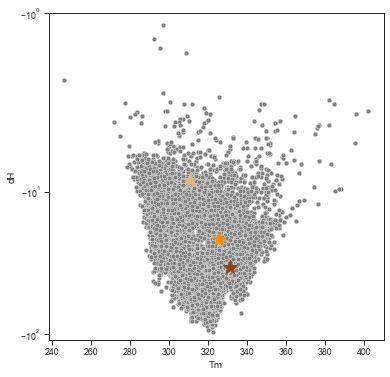

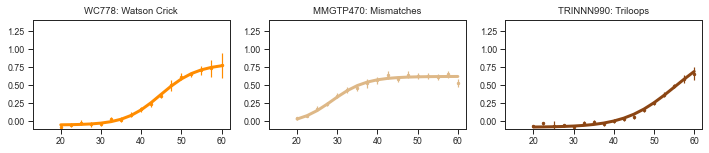

In [583]:
example_SEQID_list = ['WC778', 'MMGTP470', 'TRINNN990']

fig, ax = plt.subplots(figsize=(6,6))
sns.scatterplot(data=r1, x='Tm', y='dH', color='gray')
for i in range(len(example_SEQID_list)):
    datapoint = df.loc[example_SEQID_list[i],:]
    ax.plot([datapoint['Tm']], [datapoint['dH']], marker='*', markersize=15, color=palette[i+6])
# sns.scatterplot(data=lib2b_r1.query('not pass_chi2'), x='dH_final', y='Tm_final', color='r')
plt.ylim([-110, -1])
plt.yscale('symlog')
save_fig('./fig/example_curves/scatter.pdf')
plt.show()

fig, ax = plt.subplots(1,3, figsize=(12,2))
ax = ax.flatten()

for i in range(len(example_SEQID_list)):
    plot_actual_and_expected_fit(r1.loc[example_SEQID_list[i],:], ax[i], c=palette[i+6])
    ax[i].set_title(example_SEQID_list[i] + ': ' + annotation.loc[example_SEQID_list[i], 'ConstructClass'])
save_fig('./fig/example_curves/curves_3.pdf')
plt.show()

In [567]:
annotation

,Series,ConstructType,Scaffold,Scaffoldposition,RefSeq,dH_NUPACK,dS_NUPACK,Tm_NUPACK,dG_37C_NUPACK
SEQID,,,,,,,,,
TRINN0,TRIloop,NN,GCGC,Bottom,GCGAAAATCGC,-25.729372,-0.074312,73.083963,-2.645853
TRINN1,TRIloop,NN,GCGC,Bottom,GCGAAATTCGC,-25.729005,-0.074311,73.085315,-2.645879
TRINN2,TRIloop,NN,GCGC,Bottom,GCGAAACTCGC,-25.719284,-0.074275,73.120490,-2.646456
TRINN3,TRIloop,NN,GCGC,Bottom,GCGAAAGTCGC,-25.679438,-0.074128,73.272118,-2.650905
TRINN4,TRIloop,NN,GCGC,Bottom,GCGAATATCGC,-25.729198,-0.074311,73.084602,-2.645866
...,...,...,...,...,...,...,...,...,...
BC1,BaeControls,mismatch_controls,CG,Bottom,CAACCAGAAATGGTTG,-42.623607,-0.118901,85.328451,-5.630936
BC2,BaeControls,mismatch_controls,CG,Bottom,CTAACTGAAAAGTTAG,-39.804591,-0.114910,73.246978,-4.047113
BC3,BaeControls,mismatch_controls,AGCT,Bottom,AGAAGCCGAAAGGCTTCT,-54.517660,-0.150117,90.018171,-7.888848
